**Sentiment Analysis of Unlocked Amazon Mobile Phones**

dataset link: https://www.kaggle.com/datasets/PromptCloudHQ/amazon-reviews-unlocked-mobile-phones 


# Pip install 

In [ ]:
!pip install -U spacy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install --user --upgrade catboost
!pip install --user --upgrade ipywidgets
!pip install shap
!pip install sklearn
!pip install --upgrade numpy
!jupyter nbextension enable --py widgetsnbextension

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 76.6 MB 1.2 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 6.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Enabling notebook extension jupyter-js-widgets/extension...
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json
      - Validating: OK
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json


In [ ]:
!pip install nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import tensorflow as tf
from wordcloud import WordCloud


import re
import os

#import spacey
import spacy
from spacy.lang.en.stop_words import STOP_WORDS

#import nltk
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')

from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
english_stemmer=nltk.stem.SnowballStemmer('english')


from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer

from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.regularizers import l1, l2






#machine learning packages
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer 
from sklearn.metrics import accuracy_score, precision_score, recall_score, average_precision_score, roc_auc_score, precision_recall_curve, roc_curve, auc
from sklearn.model_selection import train_test_split 
from sklearn.base import TransformerMixin 
from sklearn.svm import LinearSVC 
from sklearn.pipeline import Pipeline 
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import GridSearchCV

#import models
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb
from sklearn.ensemble import GradientBoostingClassifier 
from sklearn.neural_network import MLPClassifier 
from sklearn.linear_model import SGDClassifier

import catboost
from catboost import *
from catboost import CatBoostClassifier



[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


# EDA / Data Cleaning

In [ ]:
#Import dataset

df = pd.read_csv ('/Amazon_Unlocked_Mobile.csv')

In [ ]:
#Check dataset
df.head()

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0


In [ ]:
#Get info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413840 entries, 0 to 413839
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Product Name  413840 non-null  object 
 1   Brand Name    348669 non-null  object 
 2   Price         407907 non-null  float64
 3   Rating        413840 non-null  int64  
 4   Reviews       413778 non-null  object 
 5   Review Votes  401544 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 18.9+ MB


In [ ]:
#Check for null values
df.isnull().sum()

Product Name        0
Brand Name      65171
Price            5933
Rating              0
Reviews            62
Review Votes    12296
dtype: int64

In [ ]:
#Drop null values for reviews as they cannot be replaced and are main category
df =df.dropna(subset=['Reviews'])
df.isnull().sum()

Product Name        0
Brand Name      65155
Price            5930
Rating              0
Reviews             0
Review Votes    12296
dtype: int64

In [ ]:
#Fill missing price values with price mean to avoid losing any reviews
pricem = df['Price'].mean()
df['Price'].fillna(value=pricem, inplace = True)
df.isnull().sum()

Product Name        0
Brand Name      65155
Price               0
Rating              0
Reviews             0
Review Votes    12296
dtype: int64

In [ ]:
#Change null review votes to 0 (what null reviews equals)
df['Review Votes'] = df['Review Votes'].fillna(0) 
df.isnull().sum()

Product Name        0
Brand Name      65155
Price               0
Rating              0
Reviews             0
Review Votes        0
dtype: int64

In [ ]:
#Change null brand names to Unkown (avoid losing any reviews)
df['Brand Name'] = df['Brand Name'].fillna('Unknown') 
df.isnull().sum()

Product Name    0
Brand Name      0
Price           0
Rating          0
Reviews         0
Review Votes    0
dtype: int64

In [ ]:
#Get description
df.describe()

,Price,Rating,Review Votes
count,413778.000000,413778.000000,413778.000000
mean,226.867148,3.819609,1.461397
std,271.056010,1.548212,9.028902
min,1.730000,1.000000,0.000000
25%,79.990000,3.000000,0.000000
50%,149.830000,5.000000,0.000000
75%,269.100000,5.000000,1.000000
max,2598.000000,5.000000,645.000000


In [ ]:
#Add column for good/bad review
#good review = 4 or 5 star review
#bad review = 1, 2 or 3 star review
df['Positive Review'] = df['Rating'].apply(lambda x: 1 if x>=4 else 0)
df.head()


,Product Name,Brand Name,Price,Rating,Reviews,Review Votes,Positive Review
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1


In [ ]:
#Create column with name positive/negative
df['Positive Review graph'] = df['Positive Review'].apply(lambda x: 'Positive' if x>= 1 else 'Negative')
df.head()

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes,Positive Review,Positive Review graph
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1,Positive
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1,Positive
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1,Positive
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1,Positive
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1,Positive


In [ ]:
#Plot positive/negative reviews
xl = 'Negative', 'Positive'
fig = px.histogram(df, x="Positive Review graph", color='Positive Review graph', labels={'x': xl}, text_auto=True, title='Review Type', width=810, height=600) 
fig.update_layout(bargap=0.2)
fig.update_layout(title_x=0.5)
fig.update_layout(showlegend=False)
fig 

In [ ]:
#Plot rating
fig = px.histogram(df, x="Rating", color='Rating', text_auto=True, title='Ratings', width=810, height=600) 
fig.update_layout(bargap=0.2)
fig.update_layout(title_x=0.5)
fig.update_layout(showlegend=False)
fig 

In [ ]:
#Plot price
fig = px.histogram(df, x="Price", text_auto=False, title='Phone Price', marginal="box") 
fig.update_layout(bargap=0.2)
fig.update_layout(title_x=0.5)
fig 

In [ ]:
#Correlation of rating
df.corr()['Rating'].sort_values()

Review Votes      -0.048884
Price              0.074133
Positive Review    0.927023
Rating             1.000000
Name: Rating, dtype: float64

In [ ]:
#Create count for product
df.rename(columns = {'Product Name':'Product_Name'}, inplace = True)
productv = df.Product_Name.value_counts()
productv.reset_index()
productv = productv.to_frame()
productv = productv.reset_index()
productv.rename(columns = {'index':'Product Name', 'Product_Name':'Review Count'}, inplace = True)
productv

,Product Name,Review Count
0,Apple iPhone 4s 8GB Unlocked Smartphone w/ 8MP...,1448
1,Apple MF259LL/A - iPhone 4s 8GB / 8MP Camera -...,1238
2,"BLU Studio 5.0 C HD Unlocked Cellphone, Black",1194
3,OtterBox Iphone 5/5S/SE Defender Case w/ Drop ...,1129
4,Motorola Moto E (1st Generation) - Black - 4 G...,1127
...,...,...
4405,Samsung Galaxy express Prime Unlocked 4G LTE J...,1
4406,Samsung Galaxy J1 Ace J111M 8GB Unlocked GSM Q...,1
4407,Samsung Galaxy J1 Ace J111M 8GB Unlocked GSM Q...,1
4408,Samsung Galaxy J1 Ace J111M LTE Dual Sim 8gb (...,1


In [ ]:
#Create top 20 phones
top_phone = productv.iloc[0:20]
top_phone

,Product Name,Review Count
0,Apple iPhone 4s 8GB Unlocked Smartphone w/ 8MP...,1448
1,Apple MF259LL/A - iPhone 4s 8GB / 8MP Camera -...,1238
2,"BLU Studio 5.0 C HD Unlocked Cellphone, Black",1194
3,OtterBox Iphone 5/5S/SE Defender Case w/ Drop ...,1129
4,Motorola Moto E (1st Generation) - Black - 4 G...,1127
5,Apple iPhone 5s 32GB (Silver) - AT&T,1118
6,BLU Energy X Plus Smartphone - With 4000 mAh S...,1111
7,Samsung Galaxy S Duos II S7582 DUAL SIM Factor...,1109
8,Samsung Galaxy S Duos II GT-S7582 Factory Unlo...,1108
9,Samsung Galaxy S Duos GT-S7562 GSM Unlocked To...,1096


In [ ]:
#Plot top 20 phones
fig = px.histogram(top_phone, x='Review Count', y="Product Name",  text_auto=False, title='Reveiew Count per Product', color='Product Name') 
fig.update_layout(bargap=0.2)
fig.update_layout(title_x=0.5)
fig.update_layout(showlegend=False)
fig 

In [ ]:
#list of top 20 phones
phonename = top_phone['Product Name']
phonename.tolist()

['Apple iPhone 4s 8GB Unlocked Smartphone w/ 8MP Camera, White (Certified Refurbished)',
 'Apple MF259LL/A - iPhone 4s 8GB / 8MP Camera - Unlocked - Black (Certified Refurbished)',
 'BLU Studio 5.0 C HD Unlocked Cellphone, Black',
 'OtterBox Iphone 5/5S/SE Defender Case w/ Drop and Dust Proctection - Realtree AP Pink',
 'Motorola Moto E (1st Generation) - Black - 4 GB - Global GSM Unlocked Phone',
 'Apple iPhone 5s 32GB (Silver) - AT&T',
 'BLU Energy X Plus Smartphone - With 4000 mAh Super Battery- US GSM Unlocked - Grey',
 'Samsung Galaxy S Duos II S7582 DUAL SIM Factory Unlocked International Version - Black',
 'Samsung Galaxy S Duos II GT-S7582 Factory Unlocked Cellphone, International Version, White',
 'Samsung Galaxy S Duos GT-S7562 GSM Unlocked Touchscreen 5MP Camera Smartphone White',
 'Samsung Galaxy S4 i9505 16GB LTE Unlocked International Version White',
 'Apple iPhone 5s AT&T Cellphone, 16GB, Silver',
 'Apple iPhone 4S 16GB Unlocked GSM - White (Certified Refurbished)',
 'BL

In [ ]:
#Average review for top phones
phonem = df.groupby(by=['Product_Name']).mean()
top20phonem = phonem.loc[['Apple iPhone 4s 8GB Unlocked Smartphone w/ 8MP Camera, White (Certified Refurbished)',
 'Apple MF259LL/A - iPhone 4s 8GB / 8MP Camera - Unlocked - Black (Certified Refurbished)',
 'BLU Studio 5.0 C HD Unlocked Cellphone, Black',
 'OtterBox Iphone 5/5S/SE Defender Case w/ Drop and Dust Proctection - Realtree AP Pink',
 'Motorola Moto E (1st Generation) - Black - 4 GB - Global GSM Unlocked Phone',
 'Apple iPhone 5s 32GB (Silver) - AT&T',
 'BLU Energy X Plus Smartphone - With 4000 mAh Super Battery- US GSM Unlocked - Grey',
 'Samsung Galaxy S Duos II S7582 DUAL SIM Factory Unlocked International Version - Black',
 'Samsung Galaxy S Duos II GT-S7582 Factory Unlocked Cellphone, International Version, White',
 'Samsung Galaxy S Duos GT-S7562 GSM Unlocked Touchscreen 5MP Camera Smartphone White',
 'Samsung Galaxy S4 i9505 16GB LTE Unlocked International Version White',
 'Apple iPhone 5s AT&T Cellphone, 16GB, Silver',
 'Apple iPhone 4S 16GB Unlocked GSM - White (Certified Refurbished)',
 'BLU Energy X Plus Smartphone - With 4000 mAh Super Battery- Global GSM Unlocked - Grey',
 'Motorola Moto E (1st Generation) - Black - 4 GB - US GSM Unlocked Phone',
 'Samsung Galaxy S5 SM-G900A GSM Unlocked Cellphone, 16GB, Blue',
 'CNPGD All-in-1 Watch Cell Phone & Smart Watch Sync to Android IOS Smart Phone (Black Plus)',
 'Apple iPhone 5s 32GB (Gold) - AT&T',
 'BLU Dash JR 4.0 K Smartphone - Unlocked - White',
 'Apple iPhone 4 32GB (Black) - AT&T']]
top20phonem = top20phonem.reset_index()
top20phonem = top20phonem.sort_values(by='Rating', ascending=False)


In [ ]:
#Plot average ratinf for top 20 phones
fig = px.histogram(top20phonem, y="Product_Name", x='Rating', text_auto=True, title='Average Rating per Product', color='Product_Name') 
fig.update_layout(bargap=0.2)
fig.update_layout(title_x=0.5, xaxis_title="Brand Name", yaxis_title='Average Rating')
fig.update_layout(showlegend=False)
fig 

In [ ]:
#Create count table for brand
df.rename(columns = {'Brand Name':'Brand_Name'}, inplace = True)
brandv = df.Brand_Name.value_counts()
brandv.reset_index()
brandv = brandv.to_frame()
brandv = brandv.reset_index()
brandv.rename(columns = {'index':'Brand Name', 'Brand_Name':'Review Count'}, inplace = True)
brandv

,Brand Name,Review Count
0,Samsung,65728
1,Unknown,65267
2,BLU,63246
3,Apple,58179
4,LG,22410
...,...,...
379,Moxee Technologies,1
380,MOTOROLA,1
381,LeEco,1
382,ToShare Tech,1


In [ ]:
# Create top 10 list (remove unkown)

top = brandv.iloc[0:21]
delll = top[top['Brand Name'] == 'Unknown'].index
top.drop(delll , inplace=True)
top

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Brand Name,Review Count
0,Samsung,65728
2,BLU,63246
3,Apple,58179
4,LG,22410
5,BlackBerry,16872
6,Nokia,16805
7,Motorola,13417
8,HTC,12724
9,CNPGD,12613
10,OtterBox,7987


In [ ]:
#Plot review count per brand
fig = px.histogram(top, x='Review Count', y="Brand Name", text_auto=True, title='Reveiew Count per Brand', color='Brand Name', width=800, height=600) 
fig.update_layout(bargap=0.2)
fig.update_layout(title_x=0.5)
fig 

In [ ]:
#Top brands to list
phonename2 = top['Brand Name']
phonename2.tolist()

['Samsung',
 'BLU',
 'Apple',
 'LG',
 'BlackBerry',
 'Nokia',
 'Motorola',
 'HTC',
 'CNPGD',
 'OtterBox',
 'Sony',
 'Posh Mobile',
 'Huawei',
 'LG Electronics',
 'samsung',
 'Polaroid',
 'ZTE',
 'Alcatel',
 'Asus',
 'verykool']

In [ ]:
#Mean price for brand
brandm = df.groupby(by=['Brand_Name']).mean()
brandm.reset_index()

,Brand_Name,Price,Rating,Review Votes,Positive Review
0,AKUA,226.867148,5.000000,0.000000,1.000000
1,AMM Global Enterprises,29.990000,4.888889,0.111111,1.000000
2,ARGOM TECH,111.720000,3.000000,0.000000,0.500000
3,ASUS,261.808137,4.482402,1.734990,0.879917
4,ASUS Computers,229.000000,4.027816,1.155772,0.752434
...,...,...,...,...,...
379,star,81.500000,3.344828,1.206897,0.517241
380,the Nokia,229.990000,3.166667,1.166667,0.500000
381,verykool,90.468806,3.626298,1.353806,0.634083
382,winwinzonece,26.990000,4.000000,3.000000,0.500000


In [ ]:
#select top 20 brands for rating
top20brandm = brandm.loc[['Samsung',
 'BLU',
 'Apple',
 'LG',
 'BlackBerry',
 'Nokia',
 'Motorola',
 'HTC',
 'CNPGD',
 'OtterBox',
 'Sony',
 'Posh Mobile',
 'Huawei',
 'LG Electronics',
 'samsung',
 'Polaroid',
 'ZTE',
 'Alcatel',
 'Asus',
 'verykool']]
top20brandm = top20brandm.reset_index()
top20brandm = top20brandm.sort_values(by='Rating', ascending=False)

In [ ]:
#Plot mean rating for top 20 brands
fig = px.histogram(top20brandm, y="Brand_Name", x='Rating', text_auto=True, title='Average Rating per Brand (top 20)', color='Brand_Name', width=800, height=600) 
fig.update_layout(bargap=0.2)
fig.update_layout(title_x=0.5, xaxis_title='Average Rating', yaxis_title='Brand Name')
fig 

In [ ]:
#Plot average price for top 20 brands
top20brandm = top20brandm.sort_values(by='Price', ascending=False)
fig = px.histogram(top20brandm, x="Brand_Name", y='Price', text_auto=True, title='Average Price per Brand', color='Brand_Name') 
fig.update_layout(bargap=0.2)
fig.update_layout(title_x=0.5, xaxis_title="Brand Name", yaxis_title='Average Price')
fig 

Word 

In [ ]:
#Create def for getting word count and reveiew length
def WordCount(text):
    word_count = 0
    for word in text.split():
        word_count += 1
    return word_count

def ReviewLength(text):
    review_length = 0
    for word in text.split():
        review_length += len(word)
    return review_length

In [ ]:
#Add rerview length and word count to df
df['review_length'] = np.array(df['Reviews'].apply(ReviewLength))
df['word_count'] = np.array(df['Reviews'].apply(WordCount))
df.head()

,Product_Name,Brand_Name,Price,Rating,Reviews,Review Votes,Positive Review,Positive Review graph,review_length,word_count
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1,Positive,303,72
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1,Positive,175,40
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1,Positive,11,2
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1,Positive,60,17
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1,Positive,181,43


In [ ]:
#Add sum of review length and word count
length_sum = df['review_length'].sum()
length_mean = df['review_length'].mean()
length_std = df['review_length'].std()
count_sum = df['word_count'].sum()
count_mean = df['word_count'].mean()
count_std = df['word_count'].std()

print('Review length sum  :',length_sum)
print('Review length mean :',length_mean)
print('Review length std  :',length_std)
print('Word count sum     :',count_sum)
print('Word count mean    :',count_mean)
print('Word count std     :',count_std)

Review length sum  : 73327120
Review length mean : 177.2136749658029
Review length std  : 378.54031339312303
Word count sum     : 16754756
Word count mean    : 40.49213829638115
Word count std     : 85.23524200096467


In [ ]:
#Plot review length
fig = px.histogram(df, x="review_length", title='Review Length (letters)', width=600, height=500)
fig.update_layout(xaxis_title='Review Length', yaxis_title='Count')
fig.update_layout(xaxis_range=[0,700])
fig.update_layout(title_x=0.5)
fig.show()

In [ ]:
#plot word count
fig = px.histogram(df, x="word_count", title='Word Count Distribution', width=600, height=500)
fig.update_layout(xaxis_range=[0,250])
fig.update_layout(xaxis_title='Word Count', yaxis_title='Count')
fig.update_layout(title_x=0.5)
fig.show()

# Text Preproccessing

Apply stemming and lemitisation then see which one performs better

stemming

In [ ]:
#Create def for stemming
def stem( review, remove_stopwords=True):
    #Remove non-letters
    review_text = re.sub("[^a-zA-Z]"," ", review)
    
    #Convert words to lower case and split them
    words = review_text.lower().split()
    
    #Optionally remove stop words (True by default)
    if remove_stopwords:
        stops = set(stopwords.words("english"))
        words = [w for w in words if not w in stops]

    b=[]
    stemmer = english_stemmer #PorterStemmer()
    for word in words:
        b.append(stemmer.stem(word))

    #Return a list of words
    return(b)

In [ ]:
#Apply stem and add to df
clean_reviews = []
for review in df['Reviews']:
    clean_reviews.append( " ".join(stem(review)))

df['Clean Review Stem'] = clean_reviews
df.head()

,Product_Name,Brand_Name,Price,Rating,Reviews,Review Votes,Positive Review,Positive Review graph,review_length,word_count,Clean Review Stem
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1,Positive,303,72,feel lucki found use phone us use hard phone l...
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1,Positive,175,40,nice phone nice grade pantach revu clean set e...
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1,Positive,11,2,pleas
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1,Positive,60,17,work good goe slow sometim good phone love
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1,Positive,181,43,great phone replac lost phone thing volum butt...


In [ ]:
#Create tokenization function plus punctual removal.
def tokenization(text, remove_stopwords=True):
        text = re.sub(r'www','https',text)
        text = re.sub(r'http[^\s]+','',text)
        text = re.sub('@[^\s]+','',text)

        tokenizer = RegexpTokenizer("[a-zA-Z]+", discard_empty=True)
        text = tokenizer.tokenize(text)
        text = " ".join(text)
        return text.lower()
    


In [ ]:
# applying tokenization along with punctuation removal and lowercasing
df['Clean Review Stem'] = df['Clean Review Stem'].apply(tokenization)
df.head()

,Product_Name,Brand_Name,Price,Rating,Reviews,Review Votes,Positive Review,Positive Review graph,review_length,word_count,Clean Review Stem
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1,Positive,303,72,feel lucki found use phone us use hard phone l...
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1,Positive,175,40,nice phone nice grade pantach revu clean set e...
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1,Positive,11,2,pleas
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1,Positive,60,17,work good goe slow sometim good phone love
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1,Positive,181,43,great phone replac lost phone thing volum butt...


Lemitization

In [ ]:
#Creat def for removing stopwords (lem def doesnt have)
def removeStopwords(text):
        updatedtext = ""

        stops = set(stopwords.words("english"))
        
        for word in text.split():
            if(word not in stops):
                updatedtext += word + " "

        return updatedtext[:-1]

In [ ]:
#Apply tekenization and remove stop words
df['Clean Reviews Lem'] = df['Reviews'].apply(tokenization)
df['Clean Reviews Lem'] = df['Clean Reviews Lem'].apply(removeStopwords)

In [ ]:
#Apply lem and add to df
sp = spacy.load('en_core_web_sm')

def lemmatizeTextSpacy(text):
    lemmatizedList = ""
    text = sp(text)
    for word in text:
        lem_word = word.lemma_
        lemmatizedList += lem_word + " "
    return lemmatizedList[:-1]

df['Clean Reviews Lem'] = df['Clean Reviews Lem'].apply(lemmatizeTextSpacy)

#1:30h

/usr/local/lib/python3.7/dist-packages/spacy/util.py:865: UserWarning:

[W095] Model 'en_core_web_sm' (3.3.0) was trained with spaCy v3.3 and may not be 100% compatible with the current version (3.4.0). If you see errors or degraded performance, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate



#Test stemming vs lemitisation

Stemming

In [ ]:
#Train Test Split
X = df['Clean Review Stem']
y= df['Positive Review']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 46, stratify = y)

In [ ]:
#Apply Tfidf (BAG OF WORDS)
tfid = TfidfVectorizer()
X_train_tdf = tfid.fit_transform(X_train)
X_test_tdf = tfid.transform(X_test)

In [ ]:
#Test on logistic model 
model_stem = LogisticRegression(max_iter=1000)
model_stem.fit(X_train_tdf, y_train)
pred = model_stem.predict(X_test_tdf)
score = accuracy_score(y_test, pred)
score

0.9060048012631511

Lemitisation

In [ ]:
#Train Test Split
X = df['Clean Reviews Lem']
y= df['Positive Review']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 46, stratify = y)

In [ ]:
#Apply Tfidf (BAG OF WORDS)
tfid = TfidfVectorizer()
X_train_tdf = tfid.fit_transform(X_train)
X_test_tdf = tfid.transform(X_test)

In [ ]:
#Test on logistic model
model_lem = LogisticRegression(max_iter=1000)
model_lem.fit(X_train_tdf, y_train)
pred = model_lem.predict(X_test_tdf)
score = accuracy_score(y_test, pred)
score

0.9060611919377447

Both methods had the same accuracy. Use stemming to reduce work time (Lem takes 1.5h to apply)

stem : 0.9060048012631511
lem  : 0.9060611919377447



# Word Clouds

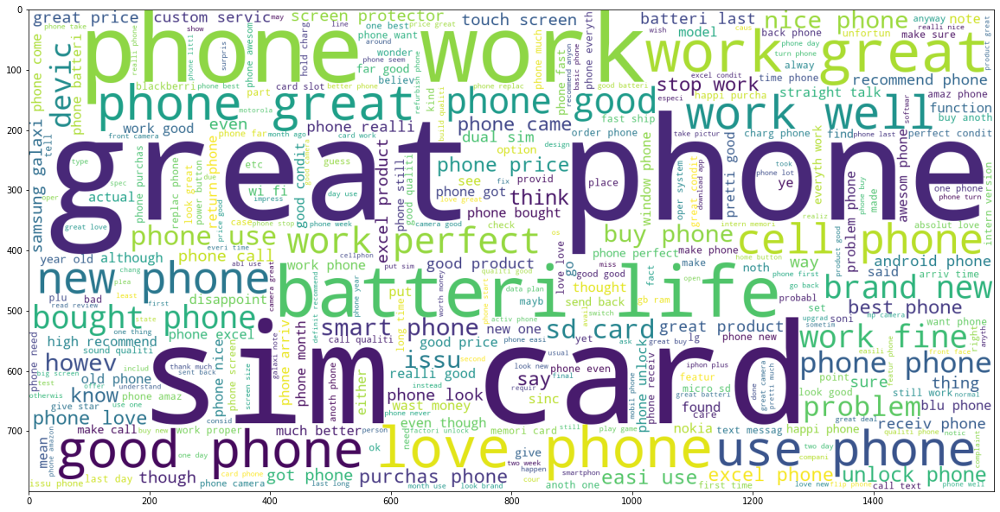

In [ ]:
#Word cloud for reviews
plt.figure(figsize=(20,20))
wc = WordCloud(max_words=1000, min_font_size=10, 
                height=800,width=1600,background_color="white").generate(' '.join(df['Clean Review Stem']))

plt.imshow(wc)

In [ ]:
#split reviews into good/bad
goodr = df.loc[df['Positive Review'] == 1]
badr = df.loc[df['Positive Review'] == 0]

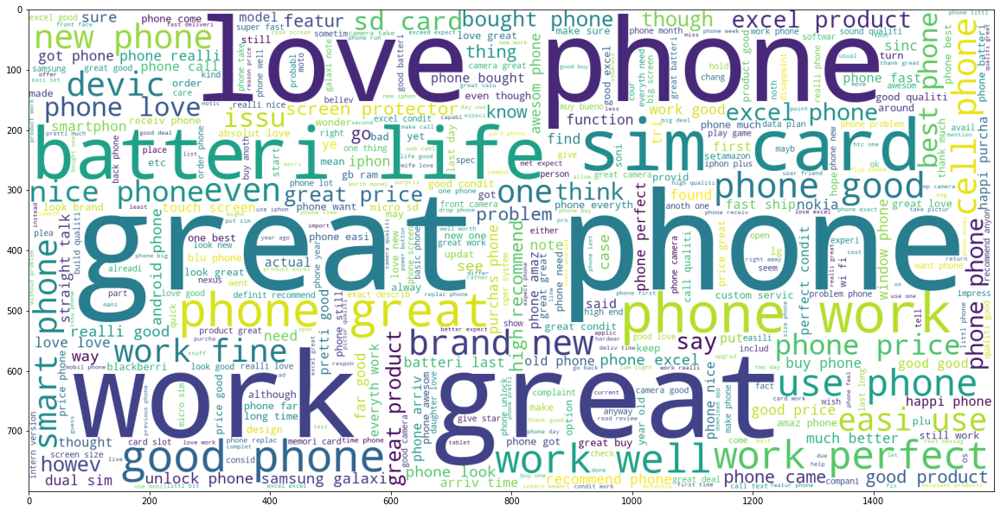

In [ ]:
#word cloud for good reviews
plt.figure(figsize=(20,20))
goodwc = WordCloud(max_words=1000, min_font_size=10, 
                height=800,width=1600,background_color="white").generate(' '.join(goodr['Clean Review Stem']))

plt.imshow(goodwc)

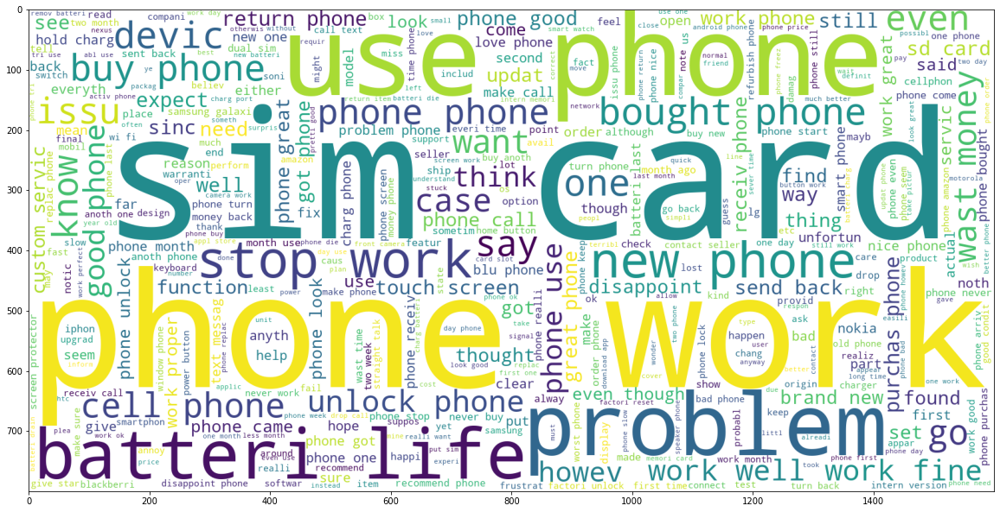

In [ ]:
#word cloud for bad reviews
plt.figure(figsize=(20,20))
badwc = WordCloud(max_words=1000, min_font_size=10, 
                height=800,width=1600,background_color="white").generate(' '.join(badr['Clean Review Stem']))

plt.imshow(badwc)

# Test all models to compare performance

In [ ]:
#Train Test Split
X = df['Clean Review Stem']
y= df['Positive Review']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 46, stratify = y)

In [ ]:
#Apply Tfidf (BAG OF WORDS)
tfid = TfidfVectorizer()
X_train_tdf = tfid.fit_transform(X_train)
X_test_tdf = tfid.transform(X_test)

In [ ]:

model1 = DecisionTreeClassifier()
model1.fit(X_train_tdf, y_train)
pred1 = model1.predict(X_test_tdf)
score1 = accuracy_score(y_test, pred1)
score1

0.9337570689738508

In [ ]:
model2 = RandomForestClassifier(n_estimators=10, verbose = True)
model2.fit(X_train_tdf, y_train)
pred2 = model2.predict(X_test_tdf)
score2 = accuracy_score(y_test, pred2)
score2

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  3.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.6s finished


0.9424734561038878

In [ ]:
model3 = LogisticRegression()
model3.fit(X_train_tdf, y_train)
pred3 = model3.predict(X_test_tdf)
score3 = accuracy_score(y_test, pred3)
score3

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



0.9056503455942772

In [ ]:
model4 = KNeighborsClassifier()
model4.fit(X_train_tdf, y_train)
pred4 = model4.predict(X_test_tdf)
score4 = accuracy_score(y_test, pred4)
score4

0.8378526431114763

In [ ]:
#use SGD instead od SCV due to large dataset (recommended by sklearn)
model5 = SGDClassifier()
model5.fit(X_train_tdf, y_train)
pred5 = model5.predict(X_test_tdf)
score5 = accuracy_score(y_test, pred5)
score5

0.893542462177969

In [ ]:
model6 = BernoulliNB()
model6.fit(X_train_tdf, y_train)
pred6 = model6.predict(X_test_tdf)
score6 = accuracy_score(y_test, pred6)
score6

0.7857637714083168

In [ ]:
model7 = AdaBoostClassifier(n_estimators = 100)
model7.fit(X_train_tdf, y_train)
pred7 = model7.predict(X_test_tdf)
score7 = accuracy_score(y_test, pred7)
score7

0.8541012132050848

In [ ]:
model8 = xgb.XGBClassifier(objective="binary:logistic")
model8.fit(X_train_tdf, y_train)
pred8 = model8.predict(X_test_tdf)
score8 = accuracy_score(y_test, pred8)
score8

0.8282017819453171

In [ ]:
model9 = GradientBoostingClassifier()
model9.fit(X_train_tdf, y_train)
pred9 = model9.predict(X_test_tdf)
score9 = accuracy_score(y_test, pred9)
score9

0.8289509723363462

In [ ]:
train = Pool(data=X_train_tdf, label=y_train)
test = Pool(data=X_test_tdf, label=y_test)

model10 = CatBoostClassifier()

model10.fit(train, eval_set=test)
pred10 = model10.predict(X_test_tdf)
score10 = accuracy_score(y_test, pred10)
score10

Learning rate set to 0.128526
0:	learn: 0.6334555	test: 0.6335232	best: 0.6335232 (0)	total: 3.23s	remaining: 53m 48s
1:	learn: 0.5916819	test: 0.5916053	best: 0.5916053 (1)	total: 5.52s	remaining: 45m 53s
2:	learn: 0.5674051	test: 0.5672618	best: 0.5672618 (2)	total: 7.51s	remaining: 41m 36s
3:	learn: 0.5472115	test: 0.5473419	best: 0.5473419 (3)	total: 9.53s	remaining: 39m 32s
4:	learn: 0.5343271	test: 0.5344069	best: 0.5344069 (4)	total: 11.3s	remaining: 37m 31s
5:	learn: 0.5206743	test: 0.5207415	best: 0.5207415 (5)	total: 13.3s	remaining: 36m 41s
6:	learn: 0.5041915	test: 0.5043260	best: 0.5043260 (6)	total: 15.3s	remaining: 36m 14s
7:	learn: 0.4971420	test: 0.4972408	best: 0.4972408 (7)	total: 17.2s	remaining: 35m 36s
8:	learn: 0.4903192	test: 0.4905119	best: 0.4905119 (8)	total: 18.9s	remaining: 34m 45s
9:	learn: 0.4828292	test: 0.4830046	best: 0.4830046 (9)	total: 20.9s	remaining: 34m 24s
10:	learn: 0.4765391	test: 0.4768628	best: 0.4768628 (10)	total: 22.8s	remaining: 34m 10s


0.9148339697423752

In [ ]:
#Create accuracy table and select best model
accuracy = pd.DataFrame({'Model': ['DecisionTree','RandomForest','LogisticRegression','KNeighbors','SGD','BernoulliNB','AdaBoost','XGB','GradientBoosting', 'CatBoost'], 
                         'Accuracy': [score1,score2,score3,score4,score5,score6,score7,score8,score9, score10]})

accuracy.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy
1,RandomForest,0.942473
0,DecisionTree,0.933757
9,CatBoost,0.914834
2,LogisticRegression,0.905650
4,SGD,0.893542
6,AdaBoost,0.854101
3,KNeighbors,0.837853
8,GradientBoosting,0.828951
7,XGB,0.828202
5,BernoulliNB,0.785764


Best model was Random Forest

# Paramater tuning/cross validation for Random Forest model

In [ ]:
#Create model and parameters
model = RandomForestClassifier()
params = { 
    'n_estimators': [30]}

#Apply grid search and cross validation
model_tuned = GridSearchCV(model, params, cv=4, refit =True, verbose=True)

In [ ]:
#Train Test Split
X = df['Clean Review Stem']
y= df['Positive Review']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 46, stratify = y)

In [ ]:
#Apply Tfidf (BAG OF WORDS)
tfid = TfidfVectorizer()
X_train_tdf = tfid.fit_transform(X_train)
X_test_tdf = tfid.transform(X_test)

In [ ]:
#Fit tuned model
model_tuned.fit(X_train_tdf, y_train)

Fitting 4 folds for each of 1 candidates, totalling 4 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(),
             param_grid={'n_estimators': [30]}, verbose=True)

In [ ]:
#Create prediction and probabaility results
y_test_pred = model_tuned.predict(X_test_tdf)
y_test_prob = model_tuned.predict_proba(X_test_tdf)

In [ ]:
#Get all score metrics
acc_2way = accuracy_score(y_test, y_test_pred)
prec_2way = precision_score(y_test, y_test_pred)
rec_2way = recall_score(y_test, y_test_pred)
roc_2way = roc_auc_score(y_test, y_test_prob[:, 1])

In [ ]:
#Create results table
randomforest_results = pd.DataFrame({'Accuracy':[acc_2way],'Precision':[prec_2way],'Recall':[rec_2way],'ROC AUC':[roc_2way]})
randomforest_results

,Accuracy,Precision,Recall,ROC AUC
0,0.952696,0.956891,0.975248,0.984619


In [ ]:
#Print confusion matrix and classification report
print(confusion_matrix(y_test, y_test_pred))
print(classification_report(y_test, y_test_pred))

[[34891  3756]
 [ 2116 83371]]
              precision    recall  f1-score   support

           0       0.94      0.90      0.92     38647
           1       0.96      0.98      0.97     85487

    accuracy                           0.95    124134
   macro avg       0.95      0.94      0.94    124134
weighted avg       0.95      0.95      0.95    124134



In [ ]:
class_r = classification_report(y_test, y_test_pred, output_dict=True)

classification_report_r = pd.DataFrame(class_r).transpose()
classification_report_r

,precision,recall,f1-score,support
0,0.942822,0.902813,0.922383,38647.000000
1,0.956891,0.975248,0.965982,85487.000000
accuracy,0.952696,0.952696,0.952696,0.952696
macro avg,0.949856,0.939030,0.944183,124134.000000
weighted avg,0.952510,0.952696,0.952408,124134.000000


In [ ]:
#Plot confusion matrix
confusion = confusion_matrix(y_test, y_test_pred)

fig = px.imshow(confusion, labels=dict(x="Predicted Value", y="Actual Vlaue"), x=['Negative','Positive'],y=['Negative','Positive'],text_auto=True, title='Confusion Matrix')
fig.update_layout(title_x=0.5)
fig.show()

In [ ]:
def show_summary_report(actual, prediction, probabilities):

    if isinstance(actual, pd.Series):
        actual = actual.values.astype(int)
    prediction = prediction.astype(int)

    print('Accuracy : %.4f [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0' % accuracy_score(actual, prediction))
    print('Precision: %.4f [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0' % precision_score(actual, prediction))
    print('Recall   : %.4f [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0' % recall_score(actual, prediction))
    print('ROC AUC  : %.4f                                                                     Best: 1, Worst: < 0.5' % roc_auc_score(actual, probabilities[:, 1]))
    print('-' * 107)
    print('TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples')

    # Confusion Matrix
    mat = confusion_matrix(actual, prediction)

    # Precision/Recall
    precision, recall, _ = precision_recall_curve(actual, prediction)
    average_precision = average_precision_score(actual, prediction)
    
    # Compute ROC curve and ROC area
    fpr, tpr, _ = roc_curve(actual, probabilities[:, 1])
    roc_auc = auc(fpr, tpr)


    # plot
    fig, ax = plt.subplots(1, 3, figsize = (18, 6))
    fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

    # Confusion Matrix
    sns.heatmap(mat.T, square = True, annot = True, fmt = 'd', cbar = False, cmap = 'Blues', ax = ax[0])

    ax[0].set_title('Confusion Matrix')
    ax[0].set_xlabel('True label')
    ax[0].set_ylabel('Predicted label')
    
    # Precision/Recall
    step_kwargs = {'step': 'post'}
    ax[1].step(recall, precision, color = 'b', alpha = 0.2, where = 'post')
    ax[1].fill_between(recall, precision, alpha = 0.2, color = 'b', **step_kwargs)
    ax[1].set_ylim([0.0, 1.0])
    ax[1].set_xlim([0.0, 1.0])
    ax[1].set_xlabel('Recall')
    ax[1].set_ylabel('Precision')
    ax[1].set_title('2-class Precision-Recall curve')

    # ROC
    ax[2].plot(fpr, tpr, color = 'darkorange', lw = 2, label = 'ROC curve (AUC = %0.2f)' % roc_auc)
    ax[2].plot([0, 1], [0, 1], color = 'navy', lw = 2, linestyle = '--')
    ax[2].set_xlim([0.0, 1.0])
    ax[2].set_ylim([0.0, 1.0])
    ax[2].set_xlabel('False Positive Rate')
    ax[2].set_ylabel('True Positive Rate')
    ax[2].set_title('Receiver Operating Characteristic')
    ax[2].legend(loc = 'lower right')


    plt.show()

Accuracy : 0.9527 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.9569 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.9752 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.9846                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


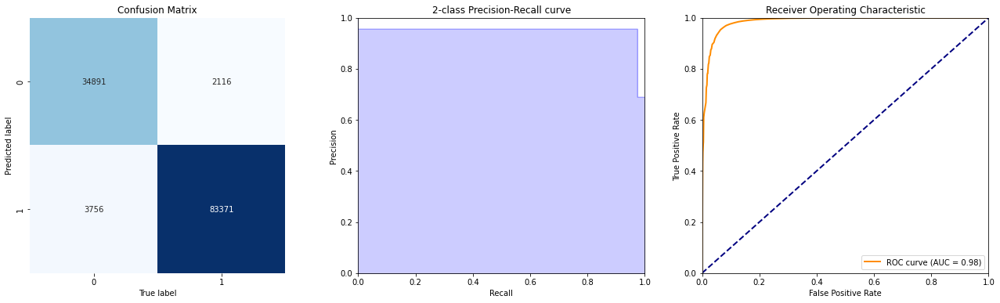

In [ ]:
show_summary_report(y_test, y_test_pred, y_test_prob)

# 3 Way Review

In [ ]:
def rating3(score):
    if score > 3:
        return 2
    elif score == 3:
        return 1
    else:
        return 0

In [ ]:
df['Good Nuetral Bad'] = df['Rating'].apply(rating3)
df.head()

,Product_Name,Brand_Name,Price,Rating,Reviews,Review Votes,Positive Review,Positive Review graph,review_length,word_count,Clean Review Stem,Good Nuetral Bad
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1,Positive,303,72,feel lucki found use phone us use hard phone l...,2
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1,Positive,175,40,nice phone nice grade pantach revu clean set e...,2
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1,Positive,11,2,pleas,2
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1,Positive,60,17,work good goe slow sometim good phone love,2
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1,Positive,181,43,great phone replac lost phone thing volum butt...,2


In [ ]:
#Train Test Split
X = df['Clean Review Stem']
y3= df['Good Nuetral Bad']
X_train, X_test, y_train3, y_test3 = train_test_split(X, y3, test_size=0.3, random_state = 46, stratify = y)

In [ ]:
#Apply Tfidf
tfid = TfidfVectorizer()
X_train_tdf3 = tfid.fit_transform(X_train)
X_test_tdf3 = tfid.transform(X_test)

In [ ]:
model_tuned3 = GridSearchCV(model, params, cv=4, refit =True, verbose=True)

In [ ]:
model_tuned3.fit(X_train_tdf3, y_train3)

Fitting 4 folds for each of 1 candidates, totalling 4 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(),
             param_grid={'n_estimators': [30]}, verbose=True)

In [ ]:
y_test_pred_3 = model_tuned3.predict(X_test_tdf3)
y_test_prob_3 = model_tuned3.predict_proba(X_test_tdf3)

In [ ]:
acc_3way = accuracy_score(y_test3, y_test_pred_3)
prec_3way = precision_score(y_test3, y_test_pred_3, average=None).mean()
rec_3way = recall_score(y_test3, y_test_pred_3, average=None).mean()
roc_3way = roc_auc_score(y_test3, y_test_prob_3, multi_class='ovr', average='macro')
print(acc_3way,prec_3way,rec_3way,roc_3way)

0.9380185928109945 0.9434536019581197 0.8332184237376502 0.9709389157845422


In [ ]:
print(confusion_matrix(y_test3, y_test_pred_3))
print(classification_report(y_test3, y_test_pred_3))

[[26414    83  2641]
 [ 1219  5778  2512]
 [ 1144    95 84248]]
              precision    recall  f1-score   support

           0       0.92      0.91      0.91     29138
           1       0.97      0.61      0.75      9509
           2       0.94      0.99      0.96     85487

    accuracy                           0.94    124134
   macro avg       0.94      0.83      0.87    124134
weighted avg       0.94      0.94      0.93    124134



In [ ]:
class_r3 = classification_report(y_test3, y_test_pred_3, output_dict=True)

classification_report_r3 = pd.DataFrame(class_r3).transpose()
classification_report_r3

,precision,recall,f1-score,support
0,0.917886,0.906514,0.912164,29138.000000
1,0.970114,0.607635,0.747236,9509.000000
2,0.942361,0.985507,0.963451,85487.000000
accuracy,0.938019,0.938019,0.938019,0.938019
macro avg,0.943454,0.833218,0.874284,124134.000000
weighted avg,0.938742,0.938019,0.934850,124134.000000


In [ ]:
confusion3 = confusion_matrix(y_test3, y_test_pred_3)

fig = px.imshow(confusion3, labels=dict(x="Predicted Value", y="Actual Vlaue"), x=['Bad','Neutral','Good'],y=['Bad','Neutral','Good'],text_auto=True, title='Three Way Confusion Matrix')
fig.update_layout(title_x=0.5)
fig.show()

# 5 way review

In [ ]:
df.head()

,Product_Name,Brand_Name,Price,Rating,Reviews,Review Votes,Positive Review,Positive Review graph,review_length,word_count,Clean Review Stem
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1,Positive,303,72,feel lucki found use phone us use hard phone l...
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1,Positive,175,40,nice phone nice grade pantach revu clean set e...
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1,Positive,11,2,pleas
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1,Positive,60,17,work good goe slow sometim good phone love
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1,Positive,181,43,great phone replac lost phone thing volum butt...


In [ ]:
#Train Test Split
X = df['Clean Review Stem']
y5= df['Rating']
X_train, X_test, y_train5, y_test5 = train_test_split(X, y5, test_size=0.3, random_state = 46, stratify = y5)

In [ ]:
#Apply Tfidf
tfid = TfidfVectorizer()
X_train_tdf5 = tfid.fit_transform(X_train)
X_test_tdf5 = tfid.transform(X_test)

In [ ]:
model_tuned5 = GridSearchCV(model, params, cv=4, refit =True, verbose=True)

In [ ]:
model_tuned5.fit(X_train_tdf5, y_train5)

Fitting 4 folds for each of 1 candidates, totalling 4 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(),
             param_grid={'n_estimators': [30]}, verbose=True)

In [ ]:
y_test_pred_5 = model_tuned5.predict(X_test_tdf5)
y_test_prob_5 = model_tuned5.predict_proba(X_test_tdf5)

In [ ]:
acc_5way = accuracy_score(y_test5, y_test_pred_5)
prec_5way = precision_score(y_test5, y_test_pred_5, average=None).mean()
rec_5way = recall_score(y_test5, y_test_pred_5, average=None).mean()
roc_5way = roc_auc_score(y_test5, y_test_prob_5, multi_class='ovr', average='macro')
print(acc_5way,prec_5way,rec_5way,roc_5way)

0.864001804501587 0.8986507985537967 0.7520365100806122 0.9552500021751357


In [ ]:
print(confusion_matrix(y_test5, y_test_pred_5))
print(classification_report(y_test5, y_test_pred_5))

[[20001    83   100   129  1388]
 [ 1488  4813    87   139   890]
 [ 1161    66  6014   279  2009]
 [  579    22   167 10636  7008]
 [  672    21    90   504 65788]]
              precision    recall  f1-score   support

           1       0.84      0.92      0.88     21701
           2       0.96      0.65      0.77      7417
           3       0.93      0.63      0.75      9529
           4       0.91      0.58      0.71     18412
           5       0.85      0.98      0.91     67075

    accuracy                           0.86    124134
   macro avg       0.90      0.75      0.80    124134
weighted avg       0.87      0.86      0.86    124134



In [ ]:
class_r5 = classification_report(y_test5, y_test_pred_5, output_dict=True)

classification_report_r5 = pd.DataFrame(class_r5).transpose()
classification_report_r5

,precision,recall,f1-score,support
1,0.836827,0.921663,0.877198,21701.000000
2,0.961638,0.648915,0.774915,7417.000000
3,0.931248,0.631126,0.752361,9529.000000
4,0.910071,0.577667,0.706734,18412.000000
5,0.853470,0.980813,0.912721,67075.000000
accuracy,0.864002,0.864002,0.864002,0.864002
macro avg,0.898651,0.752037,0.804786,124134.000000
weighted avg,0.871389,0.864002,0.855414,124134.000000


In [ ]:
#Create confusion matrix for 5 way
confusion5 = confusion_matrix(y_test5, y_test_pred_5)

fig = px.imshow(confusion5, labels=dict(x="Predicted Value", y="Actual Vlaue"), x=[1,2,3,4,5],y=[1,2,3,4,5],text_auto=True, title='Five Way Confusion Matrix')
fig.update_layout(title_x=0.5)
fig.show()

# Predictions and Results Table

2 way predictions

In [ ]:
#Create good and bad predictions
good_p = 'Great phone, had very good battery life and was quick'

bad_p = 'Phone was slow and had had a short battery life'

In [ ]:
#Create dataframe for predictions
predictions = pd.DataFrame({'Predictions':[good_p,bad_p]})

#apply lemitization, tokenization and clean
clean_reviews = []
for review in predictions['Predictions']:
    clean_reviews.append( " ".join(stem(review)))

predictions['pred clean'] = clean_reviews

predictions['pred clean'] = predictions['pred clean'].apply(tokenization)
#Transform predictions then add scores to dataframe
predictions

,Predictions,pred clean
0,"Great phone, had very good battery life and wa...",great phone good batteri life quick
1,Phone was slow and had had a short battery life,phone slow short batteri life


In [ ]:
pred_tdf = predictions['pred clean']
pred_tdf = tfid.transform(pred_tdf)
pred_score = model_tuned.predict(pred_tdf)
predictions['Predictions score'] = pred_score 
with pd.option_context('display.max_colwidth', None):
  display(predictions[['Predictions','Predictions score']])


,Predictions,Predictions score
0,"Great phone, had very good battery life and was quick",1
1,Phone was slow and had had a short battery life,0


In [ ]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(predictions)

                                                pred  \
0  Great phone, had very good battery life and wa...   
1    Phone was slow and had had a short battery life   

                            pred clean  pred scores  
0  great phone good batteri life quick            1  
1        phone slow short batteri life            0  


5 way predictions

In [ ]:
good = 'Phone was very responsive and great value for its price'

neutral = 'Average product, was slow and but had okay battery life. Looked good though'

bad = 'Bad phone, way to overpriced for its worth'

In [ ]:
predictions_5 = pd.DataFrame({'Predictions':[good, neutral, bad]})

#apply lemitization, tokenization and clean
clean_reviews = []
for review in predictions_5['Predictions']:
    clean_reviews.append( " ".join(stem(review)))

predictions_5['pred clean'] = clean_reviews

predictions_5['pred clean'] = predictions_5['pred clean'].apply(tokenization)
#Transform predictions then add scores to dataframe
predictions_5

,Predictions,pred clean
0,Phone was very responsive and great value for ...,phone respons great valu price
1,"Average product, was slow and but had okay bat...",averag product slow okay batteri life look goo...
2,"Bad phone, way to overpriced for its worth",bad phone way overpr worth


In [ ]:
pred_tdf_5 = predictions_5['pred clean']
pred_tdf_5 = tfid.transform(pred_tdf_5)
pred_score_5 = model_tuned5.predict(pred_tdf_5)
predictions_5['Predictions score'] = pred_score_5
with pd.option_context('display.max_colwidth', None):
  display(predictions_5[['Predictions','Predictions score']])

,Predictions,Predictions score
0,Phone was very responsive and great value for its price,5
1,"Average product, was slow and but had okay battery life. Looked good though",3
2,"Bad phone, way to overpriced for its worth",1


Create results table

In [ ]:
#results table

results = pd.DataFrame({'Method of scoring':['Two way (Good / Bad)','Three Way (Good / Neutral / Bad)','Five Way (1-5)'], 
                       'Accuracy':[acc_2way,acc_3way,acc_5way], 
                        'Recall':[rec_2way, rec_3way, rec_5way], 
                       'Precision':[prec_2way, prec_3way, prec_5way],
                       'ROC AUC':[roc_2way, roc_3way, roc_5way]})

results

,Method of scoring,Accuracy,Recall,Precision,ROC AUC
0,Two way (Good / Bad),0.952978,0.975306,0.957223,0.984691
1,Three Way (Good / Neutral / Bad),0.937914,0.833773,0.942813,0.971467
2,Five Way (1-5),0.864767,0.751343,0.898834,0.954907
